In [1]:


import os
import numpy as np
import pandas as pd

print("Kaggle environment initialized.")
print("\nAvailable input files:")

for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

Kaggle environment initialized.

Available input files:
/kaggle/input/datasets/jocelyndumlao/anerbc-anemia-diagnosis-using-rbc-images/AneRBC dataset a benchmark dataset for computer-aided anemia diagnosis using RBC images. httpsdoi.org10.1093databasebaae120/AneRBC_dataset/readme.txt
/kaggle/input/datasets/jocelyndumlao/anerbc-anemia-diagnosis-using-rbc-images/AneRBC dataset a benchmark dataset for computer-aided anemia diagnosis using RBC images. httpsdoi.org10.1093databasebaae120/AneRBC_dataset/upload_data_for_training.ipynb
/kaggle/input/datasets/jocelyndumlao/anerbc-anemia-diagnosis-using-rbc-images/AneRBC dataset a benchmark dataset for computer-aided anemia diagnosis using RBC images. httpsdoi.org10.1093databasebaae120/AneRBC_dataset/AneRBC-II/Anemic_individuals/CBC_reports/050_a.txt
/kaggle/input/datasets/jocelyndumlao/anerbc-anemia-diagnosis-using-rbc-images/AneRBC dataset a benchmark dataset for computer-aided anemia diagnosis using RBC images. httpsdoi.org10.1093databasebaae12

In [2]:


import torch

print("PyTorch Version:", torch.__version__)
print("CUDA Available:", torch.cuda.is_available())

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))
    device = torch.device("cuda")
else:
    print("GPU not available. Using CPU.")
    device = torch.device("cpu")

print("Using device:", device)

PyTorch Version: 2.9.0+cu126
CUDA Available: True
GPU: Tesla T4
Using device: cuda


In [3]:


import os
import cv2
import torch
import pandas as pd
import numpy as np

from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import train_test_split

import albumentations as A
from albumentations.pytorch import ToTensorV2




BASE_PATH = "/kaggle/input/datasets/jocelyndumlao/anerbc-anemia-diagnosis-using-rbc-images/AneRBC dataset a benchmark dataset for computer-aided anemia diagnosis using RBC images. httpsdoi.org10.1093databasebaae120/AneRBC_dataset/AneRBC-II"



anemic_path = os.path.join(
    BASE_PATH,
    "Anemic_individuals/RGB_segmented"
)

healthy_path = os.path.join(
    BASE_PATH,
    "Healthy_individuals/RGB_segmented"
)



if os.path.exists(anemic_path) and os.path.exists(healthy_path):

    anemic_count = len([
        f for f in os.listdir(anemic_path)
        if f.lower().endswith(('.png', '.jpg', '.jpeg'))
    ])

    healthy_count = len([
        f for f in os.listdir(healthy_path)
        if f.lower().endswith(('.png', '.jpg', '.jpeg'))
    ])

    print("✅ Dataset paths verified!")
    print("Anemic images :", anemic_count)
    print("Healthy images:", healthy_count)
    print("Total images  :", anemic_count + healthy_count)

else:

    print("❌ Dataset path error.")
    print("Check the dataset path in Kaggle.")

✅ Dataset paths verified!
Anemic images : 6000
Healthy images: 6000
Total images  : 12000


/usr/local/lib/python3.12/dist-packages/albumentations/check_version.py:147: UserWarning: Error fetching version info <urlopen error [Errno -3] Temporary failure in name resolution>
  data = fetch_version_info()


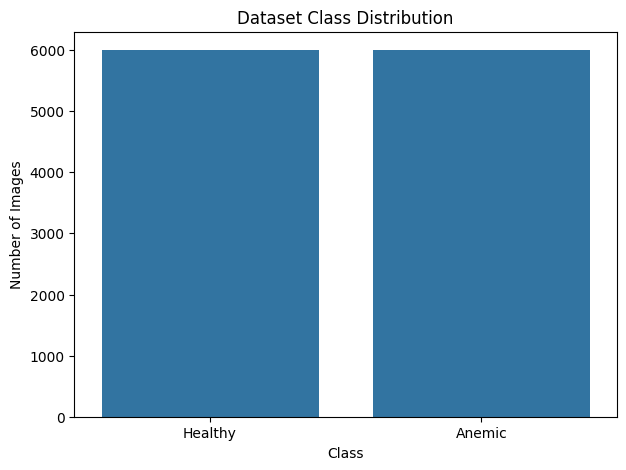

In [4]:


import matplotlib.pyplot as plt
import seaborn as sns

classes = ['Healthy', 'Anemic']
counts = [healthy_count, anemic_count]

plt.figure(figsize=(7, 5))

sns.barplot(
    x=classes,
    y=counts
)

plt.title("Dataset Class Distribution")
plt.xlabel("Class")
plt.ylabel("Number of Images")

plt.show()

In [5]:



import os

IMAGE_EXTENSIONS = (".png", ".jpg", ".jpeg", ".bmp")

images = []
labels = []



for filename in os.listdir(anemic_path):

    if filename.lower().endswith(IMAGE_EXTENSIONS):

        images.append(
            os.path.join(anemic_path, filename)
        )

        labels.append(1)


for filename in os.listdir(healthy_path):

    if filename.lower().endswith(IMAGE_EXTENSIONS):

        images.append(
            os.path.join(healthy_path, filename)
        )

        labels.append(0)


print("=" * 50)
print("IMAGE AND LABEL INFORMATION")
print("=" * 50)

print("Total images :", len(images))
print("Total labels :", len(labels))

print("\nHealthy images :", labels.count(0))
print("Anemic images  :", labels.count(1))

print("=" * 50)

IMAGE AND LABEL INFORMATION
Total images : 12000
Total labels : 12000

Healthy images : 6000
Anemic images  : 6000


In [6]:


from sklearn.model_selection import train_test_split


X_train, X_temp, y_train, y_temp = train_test_split(
    images,
    labels,
    test_size=0.20,
    stratify=labels,
    random_state=42
)

X_val, X_test, y_val, y_test = train_test_split(
    X_temp,
    y_temp,
    test_size=0.50,
    stratify=y_temp,
    random_state=42
)

print("=" * 50)
print("DATASET SPLIT")
print("=" * 50)

print("Training   :", len(X_train))
print("Validation :", len(X_val))
print("Testing    :", len(X_test))
print("Total      :", len(X_train) + len(X_val) + len(X_test))

print("=" * 50)

DATASET SPLIT
Training   : 9600
Validation : 1200
Testing    : 1200
Total      : 12000


In [7]:


from collections import Counter

print("Training distribution:")
print(Counter(y_train))

print("\nValidation distribution:")
print(Counter(y_val))

print("\nTest distribution:")
print(Counter(y_test))

Training distribution:
Counter({0: 4800, 1: 4800})

Validation distribution:
Counter({1: 600, 0: 600})

Test distribution:
Counter({1: 600, 0: 600})


In [8]:



import torch
import torch.nn as nn
import torch.nn.functional as F

from torch.utils.data import Dataset, DataLoader

import cv2
import numpy as np

import albumentations as A
from albumentations.pytorch import ToTensorV2

from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    confusion_matrix,
    classification_report,
    roc_curve,
    auc,
    roc_auc_score
)

print("PyTorch version:", torch.__version__)

device = torch.device(
    "cuda" if torch.cuda.is_available() else "cpu"
)

print("Device:", device)

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

PyTorch version: 2.9.0+cu126
Device: cuda
GPU: Tesla T4


In [9]:


train_transform = A.Compose([

    A.Resize(224, 224),

    A.HorizontalFlip(p=0.5),

    A.VerticalFlip(p=0.5),

    A.RandomRotate90(p=0.5),

    A.Normalize(
        mean=(0.5, 0.5, 0.5),
        std=(0.5, 0.5, 0.5)
    ),

    ToTensorV2()
])


val_test_transform = A.Compose([

    A.Resize(224, 224),

    A.Normalize(
        mean=(0.5, 0.5, 0.5),
        std=(0.5, 0.5, 0.5)
    ),

    ToTensorV2()
])

print("✅ Transformations created")

✅ Transformations created


In [10]:


class SickleCellDataset(Dataset):

    def __init__(self, image_paths, labels, transform=None):

        self.image_paths = image_paths
        self.labels = labels
        self.transform = transform


    def __len__(self):

        return len(self.image_paths)


    def __getitem__(self, index):

        image_path = self.image_paths[index]

        image = cv2.imread(image_path)

        if image is None:

            raise ValueError(
                f"Could not read image: {image_path}"
            )


        image = cv2.cvtColor(
            image,
            cv2.COLOR_BGR2RGB
        )

        label = self.labels[index]


        if self.transform:

            transformed = self.transform(
                image=image
            )

            image = transformed["image"]


        return image, torch.tensor(
            label,
            dtype=torch.long
        )


print("✅ Dataset class created")

✅ Dataset class created


Evaluation Metrics

In [11]:


train_dataset = SickleCellDataset(
    X_train,
    y_train,
    transform=train_transform
)

val_dataset = SickleCellDataset(
    X_val,
    y_val,
    transform=val_test_transform
)

test_dataset = SickleCellDataset(
    X_test,
    y_test,
    transform=val_test_transform
)


print("Training dataset   :", len(train_dataset))
print("Validation dataset :", len(val_dataset))
print("Testing dataset    :", len(test_dataset))

Training dataset   : 9600
Validation dataset : 1200
Testing dataset    : 1200


In [12]:


BATCH_SIZE = 32

train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=2,
    pin_memory=True
)

val_loader = DataLoader(
    val_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=2,
    pin_memory=True
)

test_loader = DataLoader(
    test_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=2,
    pin_memory=True
)


print("Train batches:", len(train_loader))
print("Val batches  :", len(val_loader))
print("Test batches :", len(test_loader))

Train batches: 300
Val batches  : 38
Test batches : 38


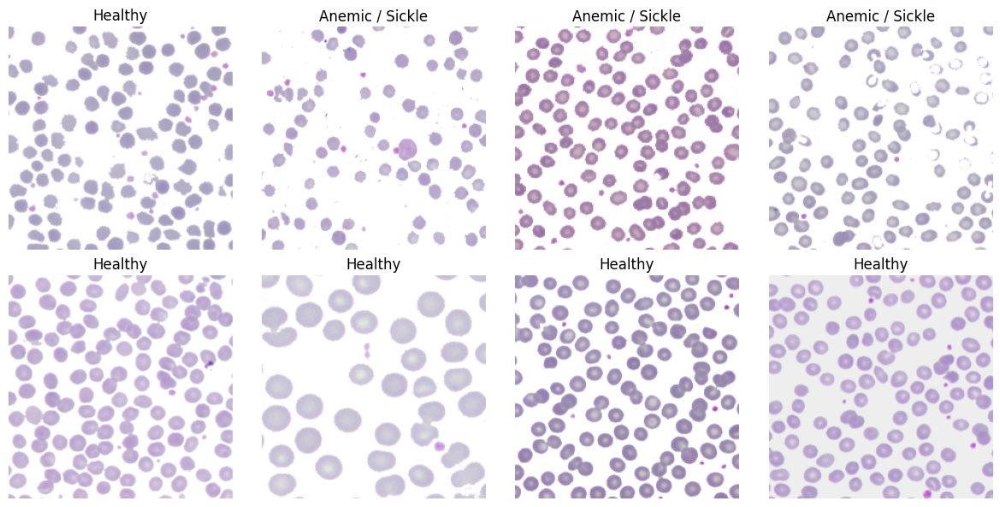

In [13]:


import matplotlib.pyplot as plt

images_batch, labels_batch = next(iter(train_loader))

plt.figure(figsize=(12, 6))

for i in range(8):

    plt.subplot(2, 4, i + 1)

    image = images_batch[i].permute(
        1, 2, 0
    ).numpy()

    # Undo normalization
    image = (image * 0.5) + 0.5

    image = np.clip(
        image,
        0,
        1
    )

    plt.imshow(image)

    if labels_batch[i].item() == 1:
        plt.title("Anemic / Sickle")
    else:
        plt.title("Healthy")

    plt.axis("off")

plt.tight_layout()
plt.show()

In [14]:


class FocalLoss(nn.Module):

    def __init__(
        self,
        gamma=2.0,
        alpha=None
    ):

        super().__init__()

        self.gamma = gamma
        self.alpha = alpha


    def forward(
        self,
        inputs,
        targets
    ):

        ce_loss = F.cross_entropy(
            inputs,
            targets,
            reduction="none"
        )

        pt = torch.exp(-ce_loss)

        focal_loss = (
            (1 - pt) ** self.gamma
        ) * ce_loss


        if self.alpha is not None:

            alpha_t = self.alpha[targets]

            focal_loss = (
                alpha_t * focal_loss
            )


        return focal_loss.mean()


print("✅ Focal Loss created")

✅ Focal Loss created


In [15]:


class SickleCellResBlock(nn.Module):

    def __init__(
        self,
        in_channels,
        out_channels,
        stride=1
    ):

        super().__init__()

        self.conv1 = nn.Conv2d(
            in_channels,
            out_channels,
            kernel_size=3,
            stride=stride,
            padding=1,
            bias=False
        )

        self.bn1 = nn.BatchNorm2d(
            out_channels
        )

        self.conv2 = nn.Conv2d(
            out_channels,
            out_channels,
            kernel_size=3,
            stride=1,
            padding=1,
            bias=False
        )

        self.bn2 = nn.BatchNorm2d(
            out_channels
        )


        # Shortcut connection
        if (
            stride != 1
            or in_channels != out_channels
        ):

            self.shortcut = nn.Sequential(

                nn.Conv2d(
                    in_channels,
                    out_channels,
                    kernel_size=1,
                    stride=stride,
                    bias=False
                ),

                nn.BatchNorm2d(
                    out_channels
                )
            )

        else:

            self.shortcut = nn.Identity()


    def forward(self, x):

        identity = self.shortcut(x)

        out = self.conv1(x)
        out = self.bn1(out)
        out = F.relu(out)

        out = self.conv2(out)
        out = self.bn2(out)

        out = out + identity

        out = F.relu(out)

        return out

In [16]:


class SCAResNet(nn.Module):

    def __init__(
        self,
        num_classes=2
    ):

        super().__init__()


        self.conv1 = nn.Conv2d(
            3,
            32,
            kernel_size=3,
            stride=1,
            padding=1,
            bias=False
        )

        self.bn1 = nn.BatchNorm2d(32)


        self.layer1 = SickleCellResBlock(
            32,
            32,
            stride=1
        )


        self.layer2 = SickleCellResBlock(
            32,
            64,
            stride=2
        )


        self.layer3 = SickleCellResBlock(
            64,
            128,
            stride=2
        )


        self.global_pool = nn.AdaptiveAvgPool2d(
            (1, 1)
        )


        self.fc = nn.Linear(
            128,
            num_classes
        )


    def forward(self, x):

        x = self.conv1(x)

        x = self.bn1(x)

        x = F.relu(x)


        x = self.layer1(x)

        x = self.layer2(x)

        x = self.layer3(x)


        x = self.global_pool(x)


        x = torch.flatten(
            x,
            1
        )


        x = self.fc(x)


        return x

In [17]:

model = SCAResNet(
    num_classes=2
)

model = model.to(device)

print(model)

SCAResNet(
  (conv1): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  (bn1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (layer1): SickleCellResBlock(
    (conv1): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (shortcut): Identity()
  )
  (layer2): SickleCellResBlock(
    (conv1): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_s

In [18]:


total_params = sum(
    p.numel()
    for p in model.parameters()
)

trainable_params = sum(
    p.numel()
    for p in model.parameters()
    if p.requires_grad
)

print("Total parameters    :", total_params)
print("Trainable parameters:", trainable_params)

Total parameters    : 307618
Trainable parameters: 307618


In [19]:


import torch.optim as optim

criterion = FocalLoss(
    gamma=2
)

optimizer = optim.Adam(
    model.parameters(),
    lr=0.001,
    weight_decay=1e-4
)

print("Loss      : Focal Loss")
print("Optimizer : Adam")
print("LR        : 0.001")
print("Weight decay:", 1e-4)

Loss      : Focal Loss
Optimizer : Adam
LR        : 0.001
Weight decay: 0.0001


In [20]:


def train_one_epoch(
    model,
    loader,
    criterion,
    optimizer,
    device
):

    model.train()

    running_loss = 0.0
    correct = 0
    total = 0


    for images, labels in loader:

        images = images.to(
            device,
            non_blocking=True
        )

        labels = labels.to(
            device,
            non_blocking=True
        )


        optimizer.zero_grad()


        outputs = model(images)

        loss = criterion(
            outputs,
            labels
        )


        loss.backward()

        optimizer.step()


        running_loss += (
            loss.item()
            * images.size(0)
        )


        _, predicted = torch.max(
            outputs,
            1
        )


        total += labels.size(0)

        correct += (
            predicted == labels
        ).sum().item()


    epoch_loss = (
        running_loss / total
    )

    epoch_accuracy = (
        correct / total
    ) * 100


    return (
        epoch_loss,
        epoch_accuracy
    )

In [21]:


def validate(
    model,
    loader,
    criterion,
    device
):

    model.eval()

    running_loss = 0.0
    correct = 0
    total = 0


    with torch.no_grad():

        for images, labels in loader:

            images = images.to(
                device,
                non_blocking=True
            )

            labels = labels.to(
                device,
                non_blocking=True
            )


            outputs = model(images)

            loss = criterion(
                outputs,
                labels
            )


            running_loss += (
                loss.item()
                * images.size(0)
            )


            _, predicted = torch.max(
                outputs,
                1
            )


            total += labels.size(0)

            correct += (
                predicted == labels
            ).sum().item()


    epoch_loss = (
        running_loss / total
    )

    epoch_accuracy = (
        correct / total
    ) * 100


    return (
        epoch_loss,
        epoch_accuracy
    )

In [22]:


import time

EPOCHS = 30

best_val_acc = 0.0
best_epoch = 0

history = {
    "train_loss": [],
    "train_acc": [],
    "val_loss": [],
    "val_acc": []
}


for epoch in range(EPOCHS):

    start_time = time.time()

    # TRAIN

    train_loss, train_acc = train_one_epoch(
        model,
        train_loader,
        criterion,
        optimizer,
        device
    )


    # VALIDATION

    val_loss, val_acc = validate(
        model,
        val_loader,
        criterion,
        device
    )
    scheduler.step(val_acc)


    # STORE HISTORY

    history["train_loss"].append(
        train_loss
    )

    history["train_acc"].append(
        train_acc
    )

    history["val_loss"].append(
        val_loss
    )

    history["val_acc"].append(
        val_acc
    )


    elapsed = time.time() - start_time


    print(
        f"Epoch [{epoch+1:02d}/{EPOCHS}] | "
        f"Train Loss: {train_loss:.4f} | "
        f"Train Acc: {train_acc:.2f}% | "
        f"Val Loss: {val_loss:.4f} | "
        f"Val Acc: {val_acc:.2f}% | "
        f"Time: {elapsed:.1f}s"
    )


    # SAVE BEST MODEL

    if val_acc > best_val_acc:

        best_val_acc = val_acc
        best_epoch = epoch + 1

        torch.save(
            model.state_dict(),
            "/kaggle/working/"
            "SCAi_SCAResNet_Best.pth"
        )

        print(
            f"   ⭐ NEW BEST MODEL: "
            f"{best_val_acc:.2f}%"
        )


print("\n" + "=" * 60)
print("TRAINING COMPLETE")
print("=" * 60)

print(
    f"Best Validation Accuracy: "
    f"{best_val_acc:.2f}%"
)

print(
    f"Best Epoch: {best_epoch}"
)

NameError: name 'scheduler' is not defined

In [ ]:


best_model_path = (
    "/kaggle/working/"
    "SCAi_SCAResNet_Best.pth"
)

model.load_state_dict(
    torch.load(
        best_model_path,
        map_location=device
    )
)

model = model.to(device)

print(
    f"✅ Loaded YOUR best model"
)

print(
    f"Best validation accuracy: "
    f"{best_val_acc:.2f}%"
)

In [ ]:


optimizer = optim.Adam(
    model.parameters(),
    lr=0.0001,
    weight_decay=1e-5
)

criterion = FocalLoss(
    gamma=2
)

FINE_TUNE_EPOCHS = 5

print(
    "Starting final fine-tuning..."
)

print(
    "Learning rate: 0.0001"
)


for epoch in range(FINE_TUNE_EPOCHS):

    train_loss, train_acc = train_one_epoch(
        model,
        train_loader,
        criterion,
        optimizer,
        device
    )


    val_loss, val_acc = validate(
        model,
        val_loader,
        criterion,
        device
    )


    print(
        f"Fine-Tune [{epoch+1}/{FINE_TUNE_EPOCHS}] | "
        f"Train Acc: {train_acc:.2f}% | "
        f"Val Acc: {val_acc:.2f}%"
    )


    if val_acc > best_val_acc:

        best_val_acc = val_acc

        torch.save(
            model.state_dict(),
            "/kaggle/working/"
            "SCAi_SCAResNet_Best.pth"
        )

        print(
            f"   ⭐ Improved model: "
            f"{val_acc:.2f}%"
        )

In [ ]:


model.load_state_dict(
    torch.load(
        "/kaggle/working/"
        "SCAi_SCAResNet_Best.pth",
        map_location=device
    )
)

model.eval()

print(
    f"✅ Final best model loaded"
)

print(
    f"Best validation accuracy: "
    f"{best_val_acc:.2f}%"
)

In [ ]:



plt.figure(figsize=(8, 5))

plt.plot(
    train_accuracies,
    label="Training Accuracy"
)

plt.plot(
    val_accuracies,
    label="Validation Accuracy"
)

plt.xlabel("Epoch")
plt.ylabel("Accuracy (%)")

plt.title(
    "SCAResNet Training and Validation Accuracy"
)

plt.legend()

plt.grid(True)

plt.show()

In [ ]:
plt.figure(figsize=(8, 5))

plt.plot(
    train_losses,
    label="Training Loss"
)

plt.plot(
    val_losses,
    label="Validation Loss"
)

plt.xlabel("Epoch")
plt.ylabel("Loss")

plt.title(
    "SCAResNet Training and Validation Loss"
)

plt.legend()

plt.grid(True)

plt.show()

In [ ]:



best_model_path = (
    "/kaggle/working/"
    "SCAi_SCAResNet_Best.pth"
)

model.load_state_dict(
    torch.load(
        best_model_path,
        map_location=device
    )
)

model = model.to(device)

model.eval()

print("✅ YOUR best SCAResNet model loaded")
print("Path:", best_model_path)

In [ ]:



model.eval()

all_labels = []
all_predictions = []
all_probabilities = []


with torch.no_grad():

    for images_batch, labels_batch in test_loader:

        images_batch = images_batch.to(device)

        outputs = model(
            images_batch
        )

        probabilities = torch.softmax(
            outputs,
            dim=1
        )

        predictions = torch.argmax(
            outputs,
            dim=1
        )


        all_labels.extend(
            labels_batch.numpy()
        )

        all_predictions.extend(
            predictions.cpu().numpy()
        )

        all_probabilities.extend(
            probabilities[:, 1].cpu().numpy()
        )


print("Test samples:", len(all_labels))

In [ ]:



accuracy = accuracy_score(
    all_labels,
    all_predictions
)

precision = precision_score(
    all_labels,
    all_predictions
)

recall = recall_score(
    all_labels,
    all_predictions
)

f1 = f1_score(
    all_labels,
    all_predictions
)


print(
    classification_report(
        all_labels,
        all_predictions,
        target_names=[
            "Healthy",
            "Sickle"
        ]
    )
)


print("\nFinal Test Metrics")
print("=" * 40)

print(
    f"Accuracy : {accuracy * 100:.2f}%"
)

print(
    f"Precision: {precision:.4f}"
)

print(
    f"Recall   : {recall:.4f}"
)

print(
    f"F1 Score : {f1:.4f}"
)

In [ ]:


cm = confusion_matrix(
    all_labels,
    all_predictions
)

plt.figure(figsize=(7, 6))

sns.heatmap(
    cm,
    annot=True,
    fmt="d",
    xticklabels=[
        "Healthy",
        "Sickle"
    ],
    yticklabels=[
        "Healthy",
        "Sickle"
    ]
)

plt.xlabel("Predicted Label")
plt.ylabel("True Label")

plt.title(
    "SCAResNet Confusion Matrix"
)

plt.show()

In [ ]:


fpr, tpr, thresholds = roc_curve(
    all_labels,
    all_probabilities
)

roc_auc = auc(
    fpr,
    tpr
)


plt.figure(figsize=(8, 6))

plt.plot(
    fpr,
    tpr,
    linewidth=2,
    label=f"AUC = {roc_auc:.4f}"
)

plt.plot(
    [0, 1],
    [0, 1],
    linestyle="--"
)

plt.xlabel(
    "False Positive Rate"
)

plt.ylabel(
    "True Positive Rate"
)

plt.title(
    "SCAResNet ROC Curve"
)

plt.legend()

plt.grid(True)

plt.show()


print(
    f"Test ROC-AUC: {roc_auc:.4f}"
)

In [ ]:


import os

os.makedirs(
    "/kaggle/working/SCAi_results",
    exist_ok=True
)

os.makedirs(
    "/kaggle/working/SCAi_models",
    exist_ok=True
)


# Save model
torch.save(
    model.state_dict(),
    "/kaggle/working/"
    "SCAi_models/SCAi_SCAResNet_Final.pth"
)


print("✅ Final model saved")
print("Location:")
print(
    "/kaggle/working/"
    "SCAi_models/SCAi_SCAResNet_Final.pth"
)

In [ ]:


import os
import cv2
import numpy as np
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt

print("✅ Grad-CAM dependencies ready")
print("Using native PyTorch implementation")

In [ ]:


class GradCAM:
    
    def __init__(self, model, target_layer):
        
        self.model = model
        self.target_layer = target_layer
        
        self.activations = None
        self.gradients = None
        
        # Register hooks
        self.forward_handle = (
            target_layer.register_forward_hook(
                self._save_activation
            )
        )
        
        self.backward_handle = (
            target_layer.register_full_backward_hook(
                self._save_gradient
            )
        )
        
    def _save_activation(
        self,
        module,
        input,
        output
    ):
        
        self.activations = output
        
    def _save_gradient(
        self,
        module,
        grad_input,
        grad_output
    ):
        
        self.gradients = grad_output[0]
    
    def generate(
        self,
        input_tensor,
        target_class
    ):
        
        
        self.model.zero_grad()
        
        
        output = self.model(
            input_tensor
        )
        
        
        target_score = output[
            0,
            target_class
        ]
        
        
        target_score.backward()
        
        
        activations = self.activations
        gradients = self.gradients
        
        
        weights = torch.mean(
            gradients,
            dim=(2, 3),
            keepdim=True
        )
        
        
        cam = torch.sum(
            weights * activations,
            dim=1
        )
        
        
        cam = F.relu(cam)
        
        
        cam = cam[0]
        
        
        cam = cam.detach().cpu().numpy()
        
        
        cam_min = cam.min()
        cam_max = cam.max()
        
        if cam_max - cam_min > 1e-8:
            
            cam = (
                cam - cam_min
            ) / (
                cam_max - cam_min
            )
            
        else:
            
            cam = np.zeros_like(
                cam
            )
        
        return cam
    
    def remove_hooks(self):
        
        self.forward_handle.remove()
        self.backward_handle.remove()


print("✅ Native Grad-CAM class created")

In [ ]:


model.eval()

target_layer = model.layer3

grad_cam = GradCAM(
    model=model,
    target_layer=target_layer
)

print("✅ Grad-CAM initialized")
print("Target layer:")
print(target_layer)

In [ ]:

def preprocess_for_gradcam(
    image_path,
    device
):
    
    
    image = cv2.imread(
        image_path
    )
    
    if image is None:
        
        raise ValueError(
            f"Could not read image: {image_path}"
        )
    
    
    image_rgb = cv2.cvtColor(
        image,
        cv2.COLOR_BGR2RGB
    )
    
    
    image_resized = cv2.resize(
        image_rgb,
        (224, 224)
    )
    
    
    visualization_image = (
        image_resized.astype(
            np.float32
        ) / 255.0
    )
    
    
    normalized = (
        visualization_image - 0.5
    ) / 0.5
    
    
    tensor = torch.from_numpy(
        normalized.transpose(
            2,
            0,
            1
        )
    ).float()
    
    
    tensor = tensor.unsqueeze(
        0
    ).to(device)
    
    return (
        visualization_image,
        tensor
    )


print("Grad-CAM preprocessing function created")

In [ ]:

def generate_gradcam(
    image_path,
    model,
    grad_cam,
    device
):
    
    
    original_image, input_tensor = (
        preprocess_for_gradcam(
            image_path,
            device
        )
    )
    
    
    model.eval()
    
    
    with torch.enable_grad():
        
        output = model(
            input_tensor
        )
        
        probabilities = torch.softmax(
            output,
            dim=1
        )
        
        predicted_class = torch.argmax(
            probabilities,
            dim=1
        ).item()
        
        
        cam = grad_cam.generate(
            input_tensor,
            predicted_class
        )
    
    
    cam = cv2.resize(
        cam,
        (224, 224)
    )
    
    
    heatmap = cv2.applyColorMap(
        np.uint8(
            255 * cam
        ),
        cv2.COLORMAP_JET
    )
    
    heatmap = cv2.cvtColor(
        heatmap,
        cv2.COLOR_BGR2RGB
    )
    
    heatmap = (
        heatmap.astype(
            np.float32
        ) / 255.0
    )
    
    
    overlay = (
        0.5 * original_image
        +
        0.5 * heatmap
    )
    
    overlay = np.clip(
        overlay,
        0,
        1
    )
    
    return (
        original_image,
        heatmap,
        overlay,
        predicted_class,
        probabilities[
            0
        ].detach().cpu().numpy()
    )


print(" Grad-CAM generation function created")

In [ ]:

sample_path = X_test[0]

(
    original,
    heatmap,
    overlay,
    predicted_class,
    probabilities
) = generate_gradcam(
    image_path=sample_path,
    model=model,
    grad_cam=grad_cam,
    device=device
)

class_names = [
    "Healthy",
    "Sickle"
]

predicted_name = class_names[
    predicted_class
]

confidence = (
    probabilities[
        predicted_class
    ] * 100
)

plt.figure(
    figsize=(15, 5)
)


plt.subplot(
    1,
    3,
    1
)

plt.imshow(
    original
)

plt.title(
    "Original Image"
)

plt.axis("off")


plt.subplot(
    1,
    3,
    2
)

plt.imshow(
    heatmap
)

plt.title(
    "Grad-CAM Heatmap"
)

plt.axis("off")



plt.subplot(
    1,
    3,
    3
)

plt.imshow(
    overlay
)

plt.title(
    f"Prediction: {predicted_name}\n"
    f"Confidence: {confidence:.2f}%"
)

plt.axis("off")

plt.tight_layout()

plt.show()

print("=" * 60)
print("GRAD-CAM RESULT")
print("=" * 60)

print(
    "Image:",
    sample_path
)

print(
    "Prediction:",
    predicted_name
)

print(
    f"Healthy probability: "
    f"{probabilities[0] * 100:.2f}%"
)

print(
    f"Sickle probability: "
    f"{probabilities[1] * 100:.2f}%"
)

In [ ]:

gradcam_base = (
    "/kaggle/working/"
    "SCAi_results/gradcam"
)

healthy_dir = os.path.join(
    gradcam_base,
    "Healthy"
)

sickle_dir = os.path.join(
    gradcam_base,
    "Sickle"
)

os.makedirs(
    healthy_dir,
    exist_ok=True
)

os.makedirs(
    sickle_dir,
    exist_ok=True
)

print(" Grad-CAM folders created")

print(
    "Healthy folder:",
    healthy_dir
)

print(
    "Sickle folder:",
    sickle_dir
)

In [ ]:

NUM_PER_CLASS = 20

healthy_count = 0
sickle_count = 0

print(
    "Generating Grad-CAM visualizations..."
)

print("=" * 60)

for image_path, true_label in zip(
    X_test,
    y_test
):

    
    if (
        healthy_count >= NUM_PER_CLASS
        and
        sickle_count >= NUM_PER_CLASS
    ):
        break

    
    if true_label == 0:
        
        if healthy_count >= NUM_PER_CLASS:
            continue

    
    elif true_label == 1:
        
        if sickle_count >= NUM_PER_CLASS:
            continue

    
    (
        original,
        heatmap,
        overlay,
        predicted_class,
        probabilities
    ) = generate_gradcam(
        image_path=image_path,
        model=model,
        grad_cam=grad_cam,
        device=device
    )

    
    filename = os.path.basename(
        image_path
    )

    filename_without_ext = (
        os.path.splitext(
            filename
        )[0]
    )

    output_filename = (
        filename_without_ext
        +
        "_gradcam.png"
    )

    
    if true_label == 0:
        
        output_path = os.path.join(
            healthy_dir,
            output_filename
        )
        
        healthy_count += 1
        
    else:
        
        output_path = os.path.join(
            sickle_dir,
            output_filename
        )
        
        sickle_count += 1

    
    cv2.imwrite(
        output_path,
        cv2.cvtColor(
            np.uint8(
                overlay * 255
            ),
            cv2.COLOR_RGB2BGR
        )
    )

print("=" * 60)

print(
    f" Healthy Grad-CAM images: "
    f"{healthy_count}"
)

print(
    f" Sickle Grad-CAM images: "
    f"{sickle_count}"
)

print(
    "Saved to:",
    gradcam_base
)

In [ ]:

import os

healthy_files = [
    f for f in os.listdir(healthy_dir)
    if f.lower().endswith(".png")
]

sickle_files = [
    f for f in os.listdir(sickle_dir)
    if f.lower().endswith(".png")
]

print("=" * 60)
print("GRAD-CAM OUTPUT VERIFICATION")
print("=" * 60)

print("Healthy Grad-CAM images :", len(healthy_files))
print("Sickle Grad-CAM images  :", len(sickle_files))
print("Total Grad-CAM images   :", 
      len(healthy_files) + len(sickle_files))

print("=" * 60)

In [ ]:

import random
import matplotlib.pyplot as plt
import cv2

healthy_samples = random.sample(
    healthy_files,
    min(4, len(healthy_files))
)

sickle_samples = random.sample(
    sickle_files,
    min(4, len(sickle_files))
)

plt.figure(figsize=(12, 8))


for i, filename in enumerate(healthy_samples):

    image_path = os.path.join(
        healthy_dir,
        filename
    )

    image = cv2.imread(image_path)
    image = cv2.cvtColor(
        image,
        cv2.COLOR_BGR2RGB
    )

    plt.subplot(2, 4, i + 1)
    plt.imshow(image)
    plt.title("Healthy Grad-CAM")
    plt.axis("off")


for i, filename in enumerate(sickle_samples):

    image_path = os.path.join(
        sickle_dir,
        filename
    )

    image = cv2.imread(image_path)
    image = cv2.cvtColor(
        image,
        cv2.COLOR_BGR2RGB
    )

    plt.subplot(2, 4, i + 5)
    plt.imshow(image)
    plt.title("Sickle Grad-CAM")
    plt.axis("off")

plt.tight_layout()
plt.show()

In [ ]:

correct_healthy = []
correct_sickle = []

false_positive = []
false_negative = []

for path, true_label in zip(
    X_test,
    y_test
):


    _, input_tensor = preprocess_for_gradcam(
        path,
        device
    )


    with torch.no_grad():

        output = model(
            input_tensor
        )

        prediction = torch.argmax(
            output,
            dim=1
        ).item()


    if true_label == 0 and prediction == 0:

        correct_healthy.append(path)

    elif true_label == 1 and prediction == 1:

        correct_sickle.append(path)

    elif true_label == 0 and prediction == 1:

        false_positive.append(path)

    elif true_label == 1 and prediction == 0:

        false_negative.append(path)


print("=" * 60)
print("PREDICTION CATEGORIES")
print("=" * 60)

print(
    "Correct Healthy :", 
    len(correct_healthy)
)

print(
    "Correct Sickle  :", 
    len(correct_sickle)
)

print(
    "False Positive  :", 
    len(false_positive)
)

print(
    "False Negative  :", 
    len(false_negative)
)

print("=" * 60)

In [ ]:

examples = {}

if len(correct_healthy) > 0:
    examples["Correct Healthy"] = correct_healthy[0]

if len(correct_sickle) > 0:
    examples["Correct Sickle"] = correct_sickle[0]

if len(false_positive) > 0:
    examples["False Positive"] = false_positive[0]

if len(false_negative) > 0:
    examples["False Negative"] = false_negative[0]


print("=" * 60)
print("SELECTED GRAD-CAM EXAMPLES")
print("=" * 60)

for category, path in examples.items():

    print(
        f"{category}: {path}"
    )

In [ ]:


fig, axes = plt.subplots(
    len(examples),
    3,
    figsize=(15, 5 * len(examples))
)

if len(examples) == 1:
    axes = np.expand_dims(
        axes,
        axis=0
    )

for row, (category, path) in enumerate(
    examples.items()
):


    (
        original,
        heatmap,
        overlay,
        predicted_class,
        probabilities
    ) = generate_gradcam(
        image_path=path,
        model=model,
        grad_cam=grad_cam,
        device=device
    )


    true_label = y_test[
        X_test.index(path)
    ]

    true_name = (
        "Healthy"
        if true_label == 0
        else "Sickle"
    )

    predicted_name = (
        "Healthy"
        if predicted_class == 0
        else "Sickle"
    )

    confidence = (
        probabilities[predicted_class]
        * 100
    )


    axes[row, 0].imshow(
        original
    )

    axes[row, 0].set_title(
        f"{category}\n"
        f"True: {true_name}"
    )

    axes[row, 0].axis("off")


    axes[row, 1].imshow(
        heatmap
    )

    axes[row, 1].set_title(
        "Grad-CAM Heatmap"
    )

    axes[row, 1].axis("off")


    axes[row, 2].imshow(
        overlay
    )

    axes[row, 2].set_title(
        f"Prediction: {predicted_name}\n"
        f"Confidence: {confidence:.2f}%"
    )

    axes[row, 2].axis("off")


plt.tight_layout()

plt.show()

In [ ]:

fig.savefig(
    "/kaggle/working/"
    "SCAi_results/"
    "SCAi_GradCAM_Examples.png",
    dpi=300,
    bbox_inches="tight"
)

print(
    " Paper-ready Grad-CAM figure saved"
)

print(
    "/kaggle/working/"
    "SCAi_results/"
    "SCAi_GradCAM_Examples.png"
)

In [ ]:

import json

results = {
    "project": "SCAi-Detect",
    "model": "SCAi-SCAResNet",
    
    "dataset": {
        "total_images": 12000,
        "training_images": 9600,
        "validation_images": 1200,
        "test_images": 1200
    },
    
    "test_metrics": {
        "accuracy": round(
            accuracy * 100,
            2
        ),
        "precision": round(
            precision,
            4
        ),
        "recall": round(
            recall,
            4
        ),
        "f1_score": round(
            f1,
            4
        ),
        "auc": round(
            roc_auc,
            4
        )
    },
    
    "best_validation_accuracy": round(
        best_val_acc,
        2
    )
}

results_path = (
    "/kaggle/working/"
    "SCAi_results/"
    "SCAi_final_results.json"
)

with open(
    results_path,
    "w"
) as f:
    
    json.dump(
        results,
        f,
        indent=4
    )

print("=" * 60)
print("FINAL RESULTS SAVED")
print("=" * 60)

print(
    json.dumps(
        results,
        indent=4
    )
)

print(
    "\nFile:",
    results_path
)